In [1]:
#Programme pour vérifier le centre de rotation

#Importation des bibliothèques

import tomopy
import dxchange
import matplotlib.pyplot as plt
import datetime
import time
import cv2
from imagestacks import create_animation # permet de mettre une image en donnée dans un tableau
from IPython.core.display import HTML



astropy module not found


In [2]:
#Definir les images à traiter
fname='/Users/leapommier/Desktop/projet multi/tilt_0_180/carteSD120321_0000.tif'
ind = [i for i in range(180)] 
print(ind)
print(fname)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179]
/Users/leapommier/Desktop/projet multi/tilt_0_180/carteSD120321_0000.tif


In [3]:
start = datetime.datetime.now()
proj = dxchange.reader.read_tiff_stack(fname,ind) 
end = datetime.datetime.now()
duree = end - start
duree
print(duree)

0:00:05.409027


In [4]:
#diminuer la taille des images
print('avant',proj.shape)
down = tomopy.misc.morph.downsample(proj, level=1, axis=1) #axe 1= ligne 
down = tomopy.misc.morph.downsample(down, level=1, axis=2) # axe 2= colonne 0= moyenne image attention 
print('apres',down.shape)

avant (180, 1388, 1038)
apres (180, 694, 519)


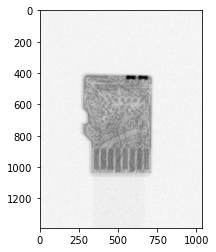

In [5]:
#afficher la  1ere image avant downsampling
image0 = proj[0,:,:] # attention que pour affichage 
plt.imshow(image0, cmap='Greys_r')
plt.show()

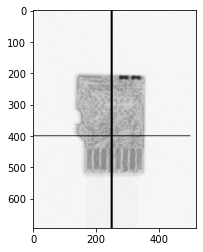

In [6]:
#afficher la  1ere image apres downsampling
image0 = down[0, :, :]


#Permet de vérifier le centre de rotation
#Trace deux lignes: 1-vertical représentant le centre de rotation. 2-horizontal: repere pour vérifier si un détail tourne bien à la meme distance du centre de rotation lors des differents angles. 

for k in range(180):
    
    down[k, :, :]= cv2.line(down[k, :, :], (250,0),(250,700), (255,255,255),6) #tracé de la ligne pour verifier le centre de rotation
    down[k, :, :]= cv2.line(down[k, :, :], (0,400),(500,400), (255,255,255),2) #verif perpendicularité axe rotation

#permet d'afficher l'image avec la verification
plt.imshow(image0, cmap='Greys_r') 
plt.show()

In [7]:
#Animation pour vérifier la symétrie d'un détail par rapport à l'axe de rotation
anim2 = create_animation(down,size=4)
display(HTML(anim2.to_jshtml()))